In [28]:
import numpy as np
from sklearn.decomposition import NMF
from sklearn import preprocessing
import matplotlib.pyplot as plt
min_max_scaler=preprocessing.MinMaxScaler()
import warnings
warnings.filterwarnings('ignore')
import glob
from sklearn.decomposition import FactorAnalysis
import os.path
from sets import Set
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
import random
from sklearn.utils import shuffle
from sklearn.feature_extraction import DictVectorizer
import pandas as pd



In [29]:
maxNoOfCircle = 30

In [30]:
L_n=5
maxNoOfIterations = 10000
min_del_e=0.0001
trainCircles = '../data/circles/train/*.circles'
testCircles = '../data/circles/test/*.circles'
featureFile ='../data/features/features_massaged.txt'
trainEgoNetFiles ='../data/egonets/train/*.egonet'
featureSet=["birthday","education;classes;description","education;classes;from;id","education;classes;from;name","education;classes;id","education;classes;name","education;classes;with;id","education;classes;with;name","education;concentration;id","education;concentration;name","education;degree;id","education;degree;name","education;school;id","education;school;name","education;type","education;with;id","education;with;name","education;year;id","education;year;name","first_name","gender","hometown;id","hometown;name","id","languages;id","languages;name","last_name","locale","location","location;id","location;name","middle_name","name","political","religion","work;description","work;employer;id","work;employer;name","work;end_date","work;from;id","work;from;name","work;location;id","work;location;name","work;position;id","work;position;name","work;projects;description","work;projects;end_date","work;projects;from;id","work;projects;from;name","work;projects;id","work;projects;name","work;projects;start_date","work;projects;with;id","work;projects;with;name","work;start_date","work;with;id","work;with;name"]

In [49]:
def loadFeatures(featureFile):
    nodesFeatures = open(featureFile, 'r')
    U=[]
    F_u=[]
    F_u_dict={}
    for nodeFeaturesText in nodesFeatures:
        nodeFeatures = nodeFeaturesText.split(' ')
        node = nodeFeatures[0]
        U.append(node)
        featureValue={}
        for featureValueText in nodeFeatures[1:]:
            featureValuePair=featureValueText.split(':')
            featureValue[featureValuePair[0]]=featureValuePair[1]
        f_u=[]
        for idx in range(len(featureSet)):
            f_u_i='-1'
            if(featureSet[idx] in featureValue):
                f_u_i = featureValue[featureSet[idx]].strip()
            f_u.append(f_u_i)
        F_u.append(f_u)
        F_u_dict[node]=f_u
    df=pd.DataFrame(F_u,  columns=featureSet)
    #print df
    vec = DictVectorizer()
    vec.fit(df.apply(lambda x: x.to_dict(), axis=1).tolist())
    return U,F_u_dict,vec
            
        

In [50]:
loadFeatures(featureFile)

(['0',
  '1',
  '2',
  '3',
  '4',
  '5',
  '6',
  '7',
  '8',
  '9',
  '10',
  '11',
  '12',
  '13',
  '14',
  '15',
  '16',
  '17',
  '18',
  '19',
  '20',
  '21',
  '22',
  '23',
  '24',
  '25',
  '26',
  '27',
  '28',
  '29',
  '30',
  '31',
  '32',
  '33',
  '34',
  '35',
  '36',
  '37',
  '38',
  '39',
  '40',
  '41',
  '42',
  '43',
  '44',
  '45',
  '46',
  '47',
  '48',
  '49',
  '50',
  '51',
  '52',
  '53',
  '54',
  '55',
  '56',
  '57',
  '58',
  '59',
  '60',
  '61',
  '62',
  '63',
  '64',
  '65',
  '66',
  '67',
  '68',
  '69',
  '70',
  '71',
  '72',
  '73',
  '74',
  '75',
  '76',
  '77',
  '78',
  '79',
  '80',
  '81',
  '82',
  '83',
  '84',
  '85',
  '86',
  '87',
  '88',
  '89',
  '90',
  '91',
  '92',
  '93',
  '94',
  '95',
  '96',
  '97',
  '98',
  '99',
  '100',
  '101',
  '102',
  '103',
  '104',
  '105',
  '106',
  '107',
  '108',
  '109',
  '110',
  '111',
  '112',
  '113',
  '114',
  '115',
  '116',
  '117',
  '118',
  '119',
  '120',
  '121',
  '122',
  '

In [45]:
def loadGraph(egoNetFile):
    egoNet = open(egoNetFile, 'r')
    alter = os.path.basename(egoNetFile).split('.')[0]
    uv={}
    U={}
    for uvs in egoNet:
        u=uvs.split(':')[0].strip()
        vs=uvs.split(':')[1].split(' ')
        for v in vs:
            v=v.strip()
            if(len(v)!=0):
                int(u)
                int(v)
                uv[(u,v)]=1
                U.add(u)
                U.add(v)
    return alter,uv,U
    

In [47]:
def loadGraphs(egoNetFile):
    uv_c={}
    for egoNetFile in glob.glob(egoNetFile):
        alter,uv=loadGraph(egoNetFile)
        uv_c[alter]=uv
    return uv_c


In [48]:
print loadGraphs(trainEgoNetFiles)

{'19268': {('19447', '19342'): 1, ('19410', '19480'): 1, ('19581', '19432'): 1, ('19302', '19495'): 1, ('19316', '19538'): 1, ('19372', '19480'): 1, ('19338', '19362'): 1, ('19480', '19398'): 1, ('19538', '19428'): 1, ('19551', '19577'): 1, ('19575', '19584'): 1, ('19606', '19501'): 1, ('19348', '19481'): 1, ('19271', '19534'): 1, ('19391', '19602'): 1, ('19270', '19560'): 1, ('19368', '19573'): 1, ('19388', '19542'): 1, ('19351', '19502'): 1, ('19498', '19545'): 1, ('19566', '19584'): 1, ('19430', '19365'): 1, ('19581', '19358'): 1, ('19470', '19413'): 1, ('19538', '19573'): 1, ('19367', '19278'): 1, ('19425', '19314'): 1, ('19603', '19533'): 1, ('19571', '19514'): 1, ('19518', '19311'): 1, ('19592', '19475'): 1, ('19511', '19345'): 1, ('19303', '19502'): 1, ('19371', '19384'): 1, ('19568', '19517'): 1, ('19530', '19426'): 1, ('19527', '19518'): 1, ('19486', '19427'): 1, ('19565', '19305'): 1, ('19573', '19425'): 1, ('19505', '19380'): 1, ('19598', '19335'): 1, ('19388', '19380'): 1, 

In [7]:
noOfNodes=100
noOfTestSamples=int(0.2*noOfNodes)
testSetExpected=np.zeros((noOfNodes,noOfNodes))
testSetIdxs=np.random.randint(0,noOfNodes-1,noOfTestSamples)

def initForCircle():
    global nodeLookUp
    global nodeIdx
    nodeLookUp={}
    nodeIdx=-1
    

In [9]:
def loadCircle(circleFiles):
    communityInfo={}
    for circleFile in glob.glob(circleFiles):
        alter = os.path.basename(circleFile).split('.')[0]
        circles = open(circleFile, 'r')
        initForCircle()
        invNodeLookUp = {}
        for circle in circles:
            nodesInCircle = circle.split()[1:]
            for node in nodesInCircle:
                invNodeLookUp[getNodeId(node)]=node
        utilMat = np.zeros((len(nodeLookUp),len(nodeLookUp)))
        circlesInfo={}
        communityInfo[alter]=circlesInfo
        circlesInfo['uv'] = utilMat
        circlesInfo['invIdx'] =invNodeLookUp
        circles = open(circleFile, 'r')
        for circle in circles:
            nodesInCircle = circle.split()[1:]
            for u in nodesInCircle:
                for v in nodesInCircle:
                    u_idx=getNodeId(u)
                    v_idx=getNodeId(v)
                    utilMat[u_idx,v_idx]=utilMat[u_idx,v_idx]+1
    return communityInfo

#print loadCircle(trainCircles)

In [8]:
nodeLookUp={}
nodeIdx=-1
def getNodeId(rawId):
    global nodeIdx
    if rawId in nodeLookUp:
        nodeId = nodeLookUp[rawId]
    else:
        nodeIdx=1+nodeIdx
        nodeId = nodeIdx
        nodeLookUp[rawId] = nodeId
    return nodeId

In [10]:
def generateFeatures(F_u,uv,u,v):
    e_uv=0
    if (u==v) or ((u,v) in uv):
        e_uv=1
    f_u=np.array(F_u[int(u)])
    f_v=np.array(F_u[int(v)])
    X_uv=((f_u == f_v) == (f_u>-1)).astype(int)
    X_uv = np.append(X_uv,e_uv)
    return X_uv

In [11]:
def trainNodeEmbedding(k,circleFiles,egoNetFile,featureFile):
    F_uv=[]
    N_uv=[]
    uv_c=loadGraphs(egoNetFile)
    F_u=loadFeatures(featureFile)
    circleInfo = loadCircle(circleFiles)
    for alter in circleInfo:
        uv=uv_c[alter]
        nodeInvIdx=circleInfo[alter]['invIdx']
        for i in range(len(nodeInvIdx)):
            for j in range(i,len(nodeInvIdx)):
                u=nodeInvIdx[i]
                v=nodeInvIdx[j]
                F_uv.append(generateFeatures(F_u,uv,u,v))
                N_uv.append(circleInfo[alter]['uv'][(i,j)])
    
    trainWs(C,F_uv,Em,10,1)
    print 'F_uv,N_uv:',len(F_uv),len(N_uv)
    fa.fit_transform(F_uv,N_uv) # as per documentation only fit_transform uses y
    return fa


In [12]:
def trainCommunityMembership(utilMat,noOfCircle):
    circleModel = NMF(n_components=noOfCircle,solver='cd',l1_ratio=0,alpha=1,tol=0.000001,init='nndsvd',nls_max_iter=10000,max_iter=10000)
    circleModel.fit(utilMat)
    return circleModel
            

In [13]:
def predictANodeCommunityMembership(utilMat,circleModel):
    return circleModel.transform(utilMat)

In [14]:
def fitForCommunintyMembership(utilMat,noOfCircle):
    circleModel = trainCommunityMembership(utilMat,noOfCircle)
    F_u_c = predictANodeCommunityMembership(utilMat,circleModel)
    return F_u_c

In [15]:
def buildUtilMatFromCircleMembership(F_u_c):
    return np.dot(F_u_c,np.transpose(F_u_c))

In [16]:
def computeFittingError(F_uv_l,F_uv_c):
    return np.sum((F_uv_l-F_uv_c)**2)
    

In [17]:
def initUtilMatrix(N,k):
    mat = np.ones((N,N))
    for i in range(N):
        for j in range(i,N):
            mat[i,j]=random.uniform(0, 1)*k
            mat[j,i]=mat[i,j]
    return mat

In [80]:
def W_ArgMax_F(L_uv_s,F_u_c):
    l_n=L_uv_s.shape[1]
    N,k=F_u_c.shape
    print N,k
    X=np.zeros((N**2,k*2))
    idx=-1
    for u in range(N):
        for v in range(N):
            idx+=1
            X[idx]=np.concatenate((F_u_c[u],F_u_c[v]))
    X_news=np.zeros((N**2,k*2))
    for i in range(l_n):
        gbr=GradientBoostingRegressor()
        X_new_processed=np.zeros((N**2,k*2))
        X_new=gbr.fit_transform(X,L_uv_s[:,i])
        print 'X,X_new',X.shape,X_new.shape
        print 'np.in1d(X,X_new)',np.in1d(X,X_new).shape
        for u in range(N):
            X_accept=np.in1d(X[u],X_new[u]).astype(int)
            print X_accept
            print X[u]
            print np.multiply(X[u],X_accept)
            X_new_processed[u]=np.multiply(X[u],np.in1d(X[u],X_new[u]).astype(int))
        #X_new=np.multiply(X_new,np.in1d(X,X_new).astype(int))
    X_new_processed=X_new_processed/l_n
    X_news=X_new_processed.reshape(N,N,k*2)
    F_u_c_new=np.zeros(F_u_c.shape)
    for u in range(N):
        for v in range(N):
            F_u_c_new[u]+=X_news[u,v][:k]
            F_u_c_new[v]+=X_news[u,v][k:]
    F_u_c_new=F_u_c_new/(N*2)
    return F_u_c_new
        

In [82]:
def predictNodeCommunityMembership(U,L_uv,k,maxIteration):
    print L_uv_s
    N = len(U)
    F_uv_c=initUtilMatrix(N,k)
    e_prev=0
    print N,k
    for u in range(N):
        for v in range
    F_u_c = np.zeros((N,k))
    for itr in range(maxIteration):
        gbr=GradientBoostingRegressor()
        F_uv_c_s=np.array(F_uv_c).reshape(N*N,1)
        print '-----------'
        print F_uv_c
        X, Y = shuffle(L_uv_s,F_uv_c_s)
        gbr.fit(X,Y)
        F_uv_l_s=gbr.predict(L_uv_s)
        F_uv_l=np.array(F_uv_l_s).reshape(N,N)
        print '++++++++++++'
        print F_uv_l
        F_u_c = fitForCommunintyMembership(F_uv_l,k)
        F_u_c = W_ArgMax_F(L_uv_s,F_u_c)
        F_u_c[F_u_c<0]=0
        F_u_c[F_u_c>1]=1
        F_uv_c = buildUtilMatFromCircleMembership(F_u_c)
        print '#############'
        print F_uv_c
        e = error(F_uv_l,F_uv_c)
        if (np.absolute(e-e_prev)/e_prev<=min_del_e):
            break;
    print '==============='
    print F_u_c
    return F_u_c,e
    

In [4]:
def trainWs(C,U,Em,la,le):
    N,N,f=U.shape
    Wa=np.array((f,l))
    We=np.array((le,1))
    for itr in range(10):
        for m in M:
            Em=0
            for u in range(N):
                for v in range(N):
                    Em=E[m,u,v]*We
            Wa=Wa+alphaWa*(2*(C[m]-U[m]*Wa*np.transpose(U[m]*Wa)-Em)*(-1*(np.transpose(U[m])*U[m]+np.transpose(U[m])*U[m])*Wa))
            We=We+alphaWe*(2*(C[m]-U[m]*Wa*np.transpose(U[m]*Wa)-Em)*(-1*np.transpose(Em)))
    return We,Wa
        
        

In [ ]:
def latentAtt(Wa,X):
    

In [ ]:
def del_F_e_uc(Xe,W,F_c,u,c):
    N,N,K=Xe.shape
    N,C=F_c.shape
    del_F_uc = 0
    for v in range(N):
        h=0
        WF_k=0
        for c_ in range(C):
            h+=W[c_]*F_c[u,c_]*F_c[v,c_]
        #h+=F_c[u,C]*F_c[v,C]
        del_F_uc=2*(Xe[u,v]-h)(-1*W[c]*F_c[v,c])
    return del_F_uc
            

In [ ]:
def del_Wa_c(X,We,F_c,k,c):
    N,N,K=X.shape
    N,C=F_c.shape
    del_W_c = 0
    for u in range(N):
        h=0
        for c_ in range(C):
            h+=W[c_]*F_c[u,c_]*F_c[v,c_]
        del_W_c=2*(X[u,k]-h)(-1*F_c[u,c]*F_c[v,c])
    return del_W_c

In [ ]:
def del_F_a_uc(Xa,W,F_c,u,c):
    N,N,K=X.shape
    N,C=F_c.shape
    del_F_uc = 0
    for k in range(K):
        h=0
        WF_k=0
        for c_ in range(C):
            h+=W[c_]*F_c[u,c_]
        #h+=F_c[u,C]*F_c[v,C]
        del_F_uc=2*(Xa[u,v]-h)(-1*W[k,c])
    return del_F_uc
    

In [ ]:
def del_Wa_kc(X,Wa,F_c,k,c):
    N,N,K=X.shape
    N,C=F_c.shape
    del_W_kc = 0
    for u in range(N):
        h=0
        for c_ in range(C):
            h+=Wa[k,c_]*F_c[u,c_]
        del_W_kc=2*(X[u,k]-h)(-1*F_c[u,c])
    return del_W_kc
    

In [ ]:
def updateFW(X,W,F_c,U):
    N=X.shape[0]
    N,C=F_c.shape
    N,N,K=X.shape
    for u in range(N):
        for c in range(C):
            F_c[u,c]=F_c[u,c]+alpha*(del_F_a_uc(Xa,W,F_c,u,c)+del_F_e_uc(Xe,W,F_c,u,c))
            F_c[u,c]=np.max(0,F_c[u,c])
    for c in range(C):
        We[c]=del_Wa_c(X,We,F_c,c)
        for k in range(K):
            Wa[k,c]=del_Wa_kc(X,Wa,F_c,k,c)
    

In [ ]:
def error():
    e=0
    for u in range(N):
        for v in range(N):
            for k in range(K):
                WF_uvkc=0
                for c in range(C):
                    WF_uvkc+W[k,c]*F[u,c]*F[v,c]
                e+=(X[u,v,k]-WF_uvkc)**2
    return e

In [78]:
def evaluateModel(fa,F_u,egoNetFiles,l_n):
    for egoNetFile in glob.glob(egoNetFiles):
        alter,uv=loadGraph(egoNetFile)
        U=Set()
        for (u,v) in uv:
            U.add(u)
            U.add(v)
        L_uv_s=np.zeros((len(U)**2,l_n))
        L_uv_idx=-1
        for u in U:
            for v in U:
                F_uv=generateFeatures(F_u,uv,u,v)
                L_uv=fa.transform(F_uv)
                L_uv_idx+=1
                L_uv_s[L_uv_idx]=L_uv
        F_u_c_k=[]
        L_uv_s=np.asarray(L_uv_s)
        optimalK=-1
        print 'egoNetFile:',egoNetFile
        for k in range(4,25):
            F_u_c,e=predictNodeCommunityMembership(U,L_uv_s,k,100)
            print e
        
      

In [64]:
factorAnalysisModel = trainNodeEmbedding(10,trainCircles,trainEgoNetFiles,featureFile)   
F_u=loadFeatures(featureFile)

F_uv,N_uv: 1102752 1102752
(1102752L, 10L)


In [83]:
evaluateModel(factorAnalysisModel,F_u,testEgoNetFiles,10) 

egoNetFile: C:/Users/gramachandran/Documents/Sachin/Sanctorium/rnd/communityDetection/data/egonets/egonets\0.egonet
[[ -0.21781192  -0.2116979   -0.03802765 ...,  -1.95183495  11.90550748
    0.36863847]
 [ -0.21977345  -0.21367013  -0.03857101 ...,   0.25976656  -0.04884333
   -0.86968093]
 [ -0.21977105  -0.21366678  -0.03856819 ...,   0.24765534  -0.03501779
    7.82581952]
 ..., 
 [ -0.21810421  -0.21180375  -0.03805291 ...,   0.79833124  -0.1524345
    5.13228903]
 [ -0.21810441  -0.21180391  -0.03805301 ...,   0.79746393  -0.15194677
    5.20470516]
 [ -0.21976393  -0.21364678  -0.03856472 ...,   0.19137885  12.05251099
   -4.14084066]]
234 4
-----------
[[ 2.24961216  2.75333744  2.33639517 ...,  3.6390624   0.77856675
   2.84331773]
 [ 2.75333744  0.43814094  0.21660526 ...,  1.80397246  1.25867711
   0.10794286]
 [ 2.33639517  0.21660526  1.79642037 ...,  0.76290909  3.05290454
   1.41945915]
 ..., 
 [ 3.6390624   1.80397246  0.76290909 ...,  0.75769753  1.76626523
   0.392022

ValueError: Array passed to NMF (input H) is full of zeros.

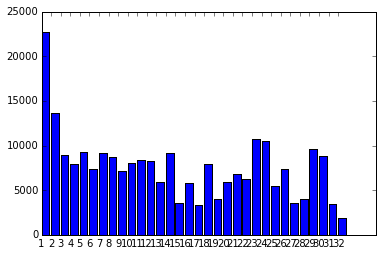

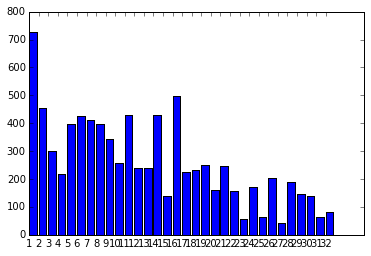

In [629]:
%matplotlib inline

def plotHist(dictValues):
    plt.bar(range(len(dictValues)), dictValues.values())
    plt.xticks(range(len(dictValues)), dictValues.keys())
    plt.show()

#plotHist(P_C)
plotHist(ssd)
plotHist(testSSE)

